# <span style="color:#f45f42">Routes on world map</span>

- The visual representation of the routes will give understanding of the geography of airline business

In [1]:
from mpl_toolkits.basemap import Basemap
m = Basemap(resolution='c',
            projection='merc',
            lat_0=0., # Center around
            lon_0=0.) # lat 0, lon 0

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import plotly
plotly.offline.init_notebook_mode()

import plotly.offline as offline
import plotly.graph_objs as go

- To plot all unique routes I have used UniqueRoutesData File

In [3]:
raw_data = '../Data/raw_data/'
uniqueroutes = pd.read_csv(raw_data +'UniqueRoutesData.csv' , low_memory=False)

In [4]:
international_routes = uniqueroutes[uniqueroutes['Country_start'] != uniqueroutes['Country_end']].reset_index(drop=True)

europe_routes = international_routes[international_routes.Continent_start.str.startswith('Europe')].reset_index(drop=True)
europe_routes = europe_routes[europe_routes.Continent_end.str.startswith('Europe')].reset_index(drop=True)

domestic_routes = uniqueroutes[uniqueroutes['Country_start'] == uniqueroutes['Country_end']].reset_index(drop=True)
domestic_routes.to_csv("../Extras/domestic_routes.csv", index=False)

domestic_US = domestic_routes[domestic_routes['Country_start'] == 'United States'].reset_index(drop=True)
domestic_US.to_csv("../Extras/domestic_US.csv", index=False)

bos_flights = domestic_US[domestic_US['City_start'] == 'Boston']
bos_flights.to_csv("../Output/BostonFlightsData.csv", index=False)

## <span style="color:#f45f42">International Routes</span>
- There are around 50000 International Routes in the world. Plotting even 10k of these routes on map takes a while. 
- Lets randomly select 10000 routes among all and plot them on World map.

/Users/sumitdeshmukh/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3260: MatplotlibDeprecationWarning:

The ishold function was deprecated in version 2.0.

/Users/sumitdeshmukh/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3269: MatplotlibDeprecationWarning:

axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.

/Users/sumitdeshmukh/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1767: MatplotlibDeprecationWarning:

The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.



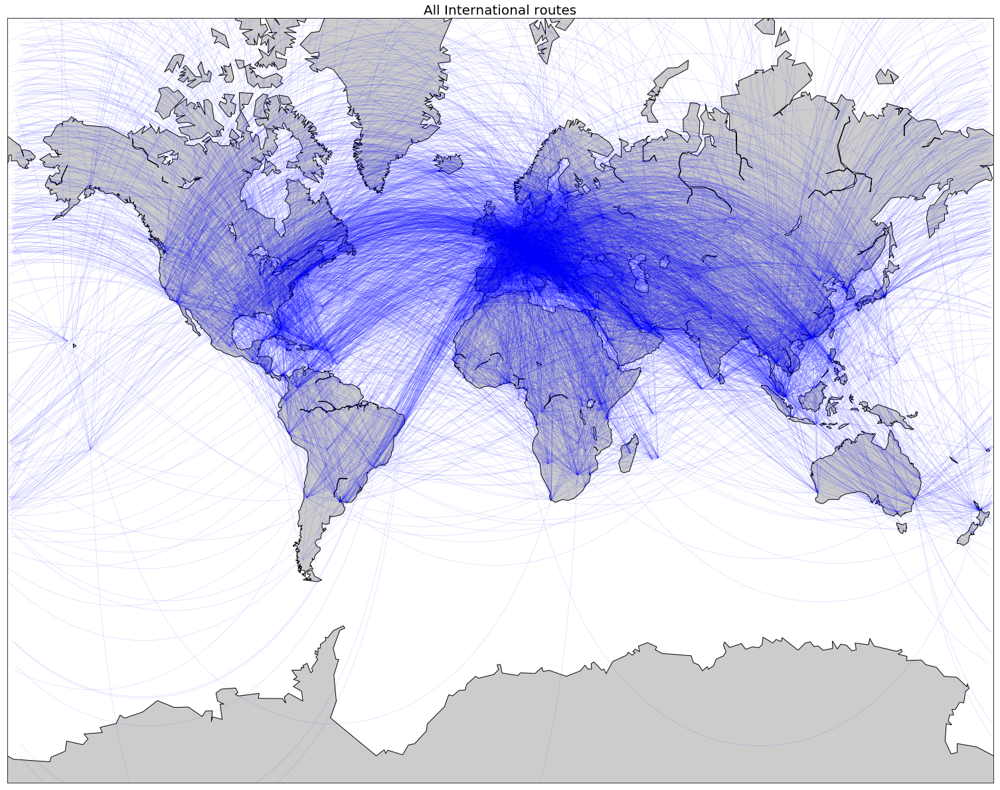

In [5]:
# Limiting plot to 10000 random records as in total there are 49815 internatinal routes
# This takes a minute or two to execute
plot_int_routes = international_routes.sample(n=10000).reset_index(drop=True)

# create new figure, axes instances.
fig=plt.figure(figsize=(27, 20))
ax=fig.add_axes([0.1,0.1,0.8,0.8])

# setup mercator map projection.
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,\
            llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    
for i, route in plot_int_routes.iterrows():
    line, = m.drawgreatcircle(route['Longitude_start'],route['Latitude_start'],route['Longitude_end'],
                      route['Latitude_end'],linewidth=0.1,color='b')
    
    path = line.get_path()
    cut_point, = np.where(np.abs(np.diff(path.vertices[:, 0])) > 30000e3)
    if len(cut_point) > 0:
        cut_point = cut_point[0]
        vertices = np.concatenate([path.vertices[:cut_point, :],
                                  [[np.nan, np.nan]],
                                  path.vertices[cut_point+1:, :]])
        path.codes = None  # treat vertices as a serie of line segments
        path.vertices = vertices
    
m.drawcoastlines()
m.fillcontinents()
ax.set_title('All International routes', fontsize=20)
plt.savefig('../Output/images/All International routes.png', format='png', bbox_inches='tight')
plt.show()
plt.close()

- We see that there is a lot of activity around Europe Region
- This poses a question that how many of these Airlines Companies have HeadQuarters in Europe Region

In [ ]:
# Headquarters for airlines


## <span style="color:#f45f42">Europian Routes</span>
- Earlier we saw Europe leading the way in having most international routes
- This is partly because of small wealthy nations close to each other
- Focusing on just the Europian routes and plotting them here

/Users/sumitdeshmukh/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3260: MatplotlibDeprecationWarning:

The ishold function was deprecated in version 2.0.

/Users/sumitdeshmukh/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3269: MatplotlibDeprecationWarning:

axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.

/Users/sumitdeshmukh/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1767: MatplotlibDeprecationWarning:

The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.



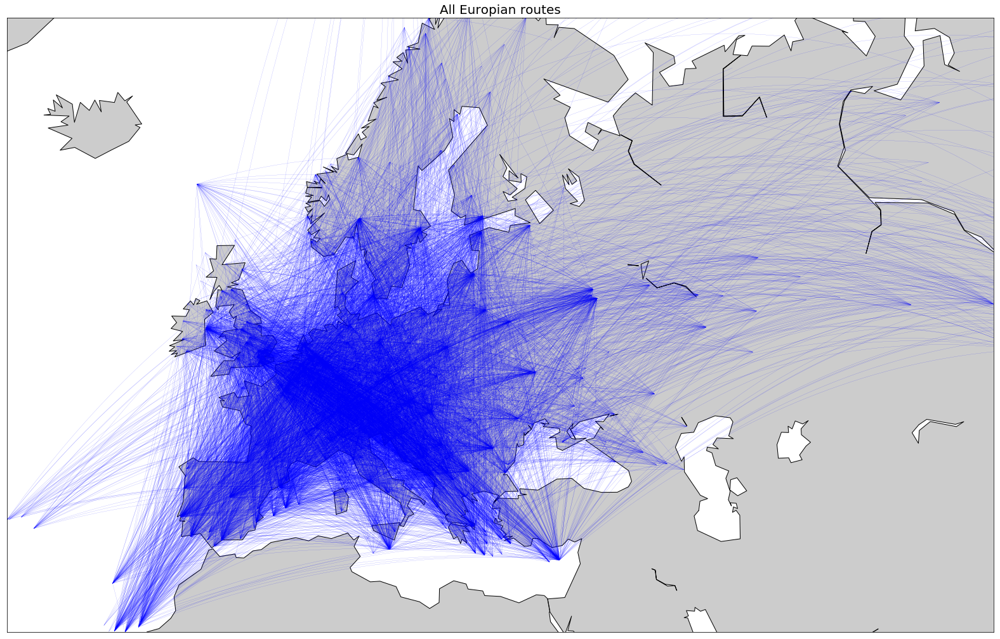

In [6]:
# create new figure, axes instances.
fig=plt.figure(figsize=(27, 20))
ax=fig.add_axes([0.1,0.1,0.8,0.8])
# setup mercator map projection.
m = Basemap(projection='merc',llcrnrlat=europe_routes['Latitude_start'].min(),
            urcrnrlat=europe_routes['Latitude_end'].max(),
            llcrnrlon=europe_routes['Longitude_start'].min(),
            urcrnrlon=europe_routes['Longitude_end'].max(),
            lat_ts=20,
            resolution='c')
    
for i, route in europe_routes.iterrows():
    line, = m.drawgreatcircle(route['Longitude_start'],route['Latitude_start'],route['Longitude_end'],
                      route['Latitude_end'],linewidth=0.1,color='b')
    
    path = line.get_path()
    cut_point, = np.where(np.abs(np.diff(path.vertices[:, 0])) > 30000e3)
    if len(cut_point) > 0:
        cut_point = cut_point[0]
        vertices = np.concatenate([path.vertices[:cut_point, :],
                                  [[np.nan, np.nan]],
                                  path.vertices[cut_point+1:, :]])
        path.codes = None  # treat vertices as a serie of line segments
        path.vertices = vertices
    
m.drawcoastlines()
m.fillcontinents()
# draw parallels
#m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
# draw meridians
#m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])
ax.set_title('All Europian routes', fontsize=20)
plt.savefig('../Output/images/All Europian routes.png', format='png', bbox_inches='tight')
plt.show()
plt.close()

- We can clearly see that due to abundance of domestic europian routes and plethora of airlines that connects East to West that makes stops at Europain Airports have given tag of Busiest Airports of the world to Most Europian Airports.
- Please see Analysis 2 to understand most routes serving Airports of the world.
- Let us have one more visual represntation of these routes on Plotly to get sense of Airports that fly here
- Plotly restricts the data points it can safely plot so taking atmost 2000 random samples among all the Europian Routes

In [7]:
euro_routes = europe_routes.sample(n=2000).reset_index(drop=True)

euro_routes['starttext'] = euro_routes['Airport_start'] + '<br>' + euro_routes['City_start']+ '<br>' + euro_routes['Country_start']
euro_routes['endtext'] = euro_routes['Airport_end'] + '<br>' + euro_routes['City_end']+ '<br>'+ euro_routes['Country_end']

airports = [ dict(
        type = 'scattergeo',
        locationmode = 'country names',
        lon = euro_routes['Longitude_start'],
        lat = euro_routes['Latitude_start'],
        hoverinfo = 'text',
        text = euro_routes['starttext'],
        mode = 'markers',
        legendgroup =  'group1',
        name = 'No Stops<br>(Destination)<br>Airports',
        marker = dict( 
            size=7, 
            color='rgb(204, 0, 0)',
            line = dict(
                width=9,
                color='rgba(68, 68, 68, 0)'
            )
        ))]

airports.append(
        dict(
            type = 'scattergeo',
            locationmode = 'country names',
            lon = euro_routes['Longitude_end'],
            lat = euro_routes['Latitude_end'],
            hoverinfo = 'text',
            text = euro_routes['endtext'],
            mode = 'markers',
            legendgroup =  'group2',
            name = 'Connecting<br>(Layover)<br>Airports',
            marker = dict( 
                size=6, 
                color='rgb(255, 102, 102)',
                line = dict(
                    width=9,
                    color='rgba(68, 68, 68, 0)'
                ),
                opacity = 0.4,
            )
        )
)
        
flight_paths = []
for i in range( len( euro_routes )):
    flight_paths.append(
        dict(
            type = 'scattergeo',
            locationmode = 'country names',
            lon = [ euro_routes['Longitude_start'][i], euro_routes['Longitude_end'][i] ],
            lat = [ euro_routes['Latitude_start'][i], euro_routes['Latitude_end'][i] ],
            mode = 'lines',
            line = dict(
                width = 0.4,
                color = 'blue',
            ),
            opacity = 0.4,
            showlegend=False,
        )
    )
    
layout = dict(
        title = 'Europe flight routes',
        geo = dict(
            scope='europe',
            projection=dict( type='equirectangular' ),
            showland = True,
            landcolor = 'rgb(217, 217, 217)',
            countrycolor = 'rgb(204, 204, 204)',
            resolution = 110,
        ),
        width = 1024,
        height = 768,
    )
    
fig = dict( data= flight_paths + airports, layout=layout )
offline.iplot( fig, filename='Europe flight routes' )

## <span style="color:#f45f42">Domestic Routes</span>
- It would be fairly Interesting to see domestic route activity among all the nations of the world

/Users/sumitdeshmukh/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3260: MatplotlibDeprecationWarning:

The ishold function was deprecated in version 2.0.

/Users/sumitdeshmukh/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3269: MatplotlibDeprecationWarning:

axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.

/Users/sumitdeshmukh/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1767: MatplotlibDeprecationWarning:

The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.



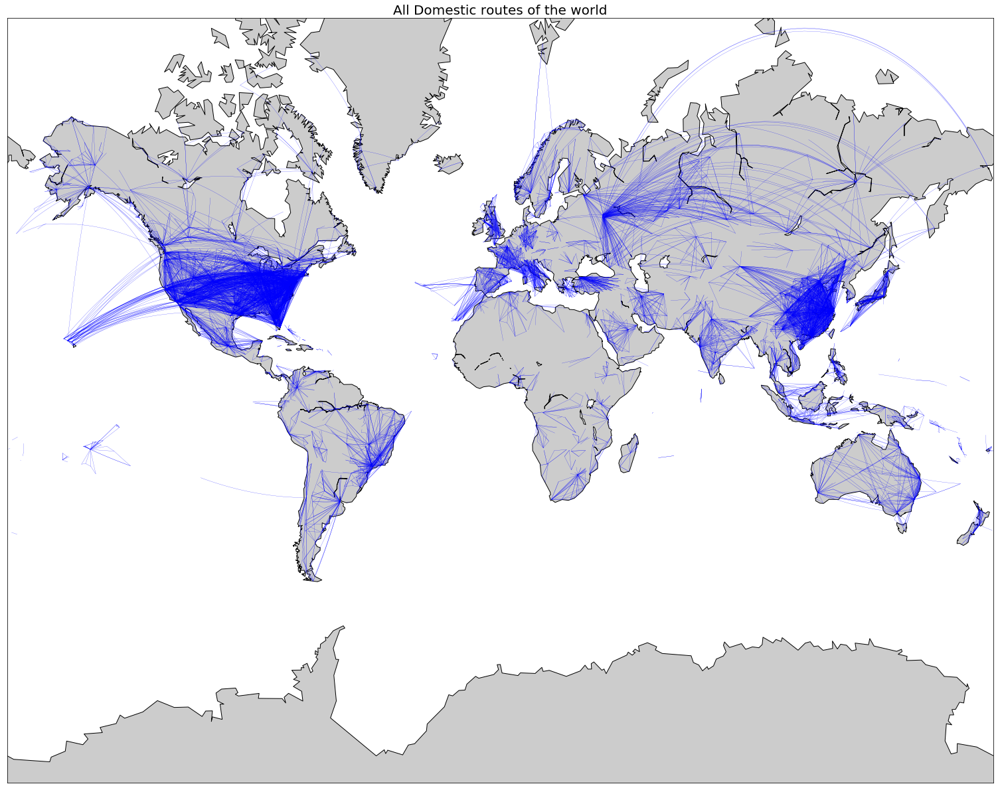

In [8]:
# create new figure, axes instances.
fig=plt.figure(figsize=(27, 20))
ax=fig.add_axes([0.1,0.1,0.8,0.8])
# setup mercator map projection.
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,\
            llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    
for i, route in domestic_routes.iterrows():
    line, = m.drawgreatcircle(route['Longitude_start'],route['Latitude_start'],route['Longitude_end'],
                      route['Latitude_end'],linewidth=0.2,color='b')
    
    path = line.get_path()
    cut_point, = np.where(np.abs(np.diff(path.vertices[:, 0])) > 30000e3)
    if len(cut_point) > 0:
        cut_point = cut_point[0]
        vertices = np.concatenate([path.vertices[:cut_point, :],
                                  [[np.nan, np.nan]],
                                  path.vertices[cut_point+1:, :]])
        path.codes = None  # treat vertices as a series of line segments
        path.vertices = vertices
    
m.drawcoastlines()
m.fillcontinents()
# draw parallels
#m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
# draw meridians
#m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])
ax.set_title('All Domestic routes of the world', fontsize=20)
plt.show()
plt.savefig('../Output/images/All Domestic routes of the world.png', format='png', bbox_inches='tight')
plt.close()

- This clearly suggests United States leads in domestic activity of airlines.
- This shows the nations dependence on Flying airlines. Even history of planes started at United states and it really is a super power when it comes to flying in the sky.
- Let us see one more representation on plotly to clearly distinguish between Airports where Layover activity is included too

In [9]:
#domestic_US = domestic_US.sample(n=2000).reset_index(drop=True)

domestic_US['starttext'] = domestic_US['Airport_start'] + '<br>' + domestic_US['City_start']+ '<br>' + domestic_US['Country_start']
domestic_US['endtext'] = domestic_US['Airport_end'] + '<br>' + domestic_US['City_end']+ '<br>'+ domestic_US['Country_end']

airports = [ dict(
        type = 'scattergeo',
        locationmode = 'USA-states',
        lon = domestic_US['Longitude_start'],
        lat = domestic_US['Latitude_start'],
        hoverinfo = 'text',
        text = domestic_US['starttext'],
        mode = 'markers',
        legendgroup =  'group1',
        name = 'No Stops<br>(Destination)<br>Airports',
        marker = dict( 
            size=6, 
            color='rgb(204, 0, 0)',
            line = dict(
                width=9,
                color='rgba(68, 68, 68, 0)'
            )
        ))]

airports.append(
        dict(
            type = 'scattergeo',
            locationmode = 'country names',
            lon = domestic_US['Longitude_end'],
            lat = domestic_US['Latitude_end'],
            hoverinfo = 'text',
            text = domestic_US['endtext'],
            mode = 'markers',
            legendgroup =  'group2',
            name = 'Connecting<br>(Layover)<br>Airports',
            marker = dict( 
                size=5, 
                color='rgb(255, 153, 153)',
                line = dict(
                    width=9,
                    color='rgba(68, 68, 68, 0)'
                ),
                opacity = 0.4,
            )
        )
)
        
flight_paths = []
for i in range( len( domestic_US )):
    flight_paths.append(
        dict(
            type = 'scattergeo',
            locationmode = 'USA-states',
            lon = [ domestic_US['Longitude_start'][i], domestic_US['Longitude_end'][i] ],
            lat = [ domestic_US['Latitude_start'][i], domestic_US['Latitude_end'][i] ],
            mode = 'lines',
            line = dict(
                width = 0.4,
                color = 'blue',
            ),
            opacity = 0.6,
            showlegend=False,
        )
    )
    
layout = dict(
        title = 'United States Domestic flight routes',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showland = True,
            landcolor = 'rgb(217, 217, 217)',
            countrycolor = 'rgb(204, 204, 204)',
            resolution = 110,
        ),
    )
    
fig = dict( data= flight_paths + airports, layout=layout )
offline.iplot( fig, filename='USA Flight Routes' )

- This analysis leads to one more intersting question. How is the distribution of airlines to served routes with all available international routes
- This will give glimpse at many airlines with maximum served routes

In [10]:
grouped = uniqueroutes.groupby(['Airline_Name_x'])
major_airlines = pd.DataFrame({'# Routes Served' : grouped['Airline_Name_x'].size()}).reset_index()
major_airlines.sort_values(by=['# Routes Served'], ascending=False, inplace=True)
major_airlines.reset_index(drop=True, inplace=True)
major_airlines['% Routes Served'] = (major_airlines['# Routes Served'] * 100) / major_airlines['# Routes Served'].sum()
major_airlines.head()

,Airline_Name_x,# Routes Served,% Routes Served
0,Condor,1862,4.481671
1,Air France,1742,4.192842
2,KLM,1521,3.660914
3,Pegasus Airlines,1512,3.639252
4,Etihad Airways,1441,3.468361


- Lets plot a bar plot to compare every airline with one another
- We can zoom out or click reset to see every airline on Y index and their corresponding routes served on X axis

In [11]:
trace = go.Bar(
    x = major_airlines['# Routes Served'],
    y = major_airlines['Airline_Name_x'],
    text = major_airlines['Airline_Name_x'],
    marker=dict(
        color='rgb(158,202,225)',
        line=dict(
            color='rgb(8,48,107)',
            width=1.5,
        )
    ),
    opacity=0.6,
    orientation = 'h',
)

data = [trace]

layout = go.Layout(
    title='Airlines and Number of Routes they Serve',
    yaxis = dict(
        autorange = False,
        title = "Major Airines"
    ),
    margin = dict(
        l = 100,
    ),
    xaxis = dict(
        title = "Number of Serving Routes",
    ),
)

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='Airlines and Number of Routes they serve', image_width=1024,
              image_height=768)

- We can see that Europian and Middle eastern country headquarted airlines topping the chart here
- Due to their geographical location of being at the center of East and West these regions will always enjoy the opportunity of being at the center of Aviation Industry.